## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

#### Load a sample calibration image

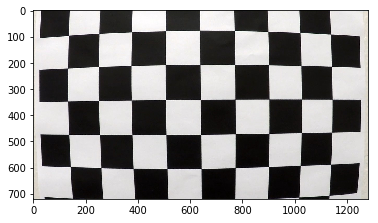

In [1]:
import numpy as np
import cv2
import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

images = glob.glob('./camera_cal/calibration*.jpg')

plt.imshow(mpimg.imread(images[0]))


#### Run calibration on the image files to compute image_world_points for the corresponding obj_world_points

In [2]:
def plot_calibration(images) :
    
    row_num = int(len(images) / 5)
    if len(images) % 5 != 0:
        row_num += 1
        
    f,axarr = plt.subplots(row_num,5, figsize=(20,8))
    ax = enumerate(axarr.reshape(-1))
    for i in range(0, len(images)) :
        t, axes=next(ax)
        axes.imshow(images[i])
        
        
def run_calibration(calib_image_files,  show_calib_plots=False, corner_dims =(9,6)) :
    """
    Run calibration on list of image files and return (obj_world_points, image_world_points) that caller can use for
    camera calibration
    
    param : calib_image_files - list of file names to calibrate upon
    param : corner_dims - tuple (corner points per row, corner points per col) of chess board corner size
    param : show_calib_ouput - boolean  - if tru plot images and calibration points
    
    return: tuple (obj_world_points, image_world_points) 
    """
    # Set the real world object points to co-ords .e.g, top 1st corner will be (0,0,0) the next one (1,0,0) and so on 
    # until (8,5,0)
    objp = np.zeros((corner_dims[0] * corner_dims[1], 3), np.float32)
    # if corner_dims are (9,6) then using transpose of np.mgrid and reshaping to 2 cols, set the first 2 cols of 
    # objp with value (0,0) , (1,0),(2,0)
    objp[:,:2] = np.mgrid[0:corner_dims[0], 0:corner_dims[1]].T.reshape(-1,2) 
    
    # create obj_points (obj world points) to store the objp created above for every calibrated image 
    # (we store the same objp)
    obj_world_points = []
    # image world points will be computed (chess board corners)
    image_world_points = []
    
    # initialize draw_images for plotting
    draw_images=[]
        
    for i, fname in enumerate(calib_image_files) :
        
        image = mpimg.imread(fname)
        
        # gray scale the image before calibrating
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        ret,corners = cv2.findChessboardCorners(gray, corner_dims, None)
        
        if ret == True :
            # corners found. add obj_point and the calculated coners to obj and image world pts respectively
            obj_world_points.append(objp)
            image_world_points.append(corners)
            
            if show_calib_plots :
                draw_img = cv2.drawChessboardCorners(image, corner_dims, corners, ret)
                draw_images.append(draw_img)
                
    if show_calib_plots:
        plot_calibration(draw_images)
        
    return (obj_world_points, image_world_points)

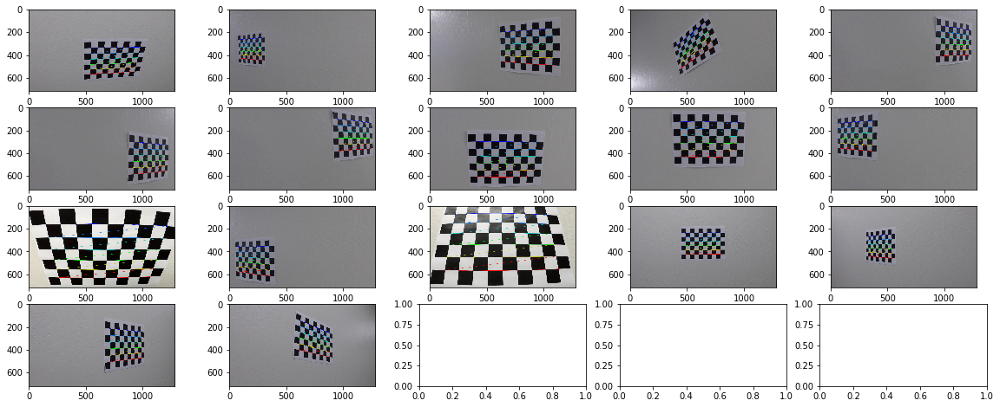

In [3]:
images = glob.glob('./camera_cal/calibration*.jpg')
(obj_world_points, image_world_points) = run_calibration(images,  show_calib_plots=True)

### Calibrate Camera

Using run_calibration method defined above compute obj_world_points and image_world_points. Then use them to calibrate camera which returns the calibration_matrix and distortion coefficients

In [4]:

def calibrate_camera(test_image_filename) :
    """
    calibrates camera on the test image file
    
    return (mtx,dist) - calibration matrix and distortion coefficients
    """
    fnames = glob.glob('./camera_cal/calibration*.jpg')
    (obj_world_points, image_world_points) = run_calibration(fnames,  show_calib_plots=False)
    
    test_img = mpimg.imread(test_image_filename)
    print("test image shape:", test_img.shape)
    ### image size should go in width,height
    img_size = (test_img.shape[1], test_img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_world_points, image_world_points,img_size, None, None)
    
    return (mtx, dist)

In [5]:
mtx, dist = calibrate_camera("./camera_cal/calibration1.jpg")

test image shape: (720, 1280, 3)


#### Undistort image with mtx and dist coefficients that we got from calibration

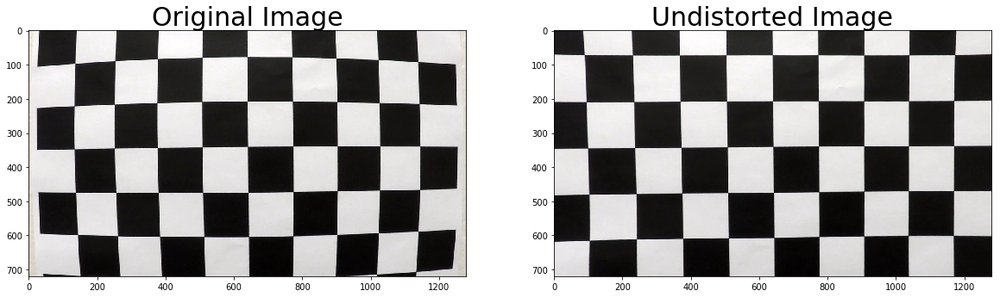

In [6]:

test_img = mpimg.imread("./camera_cal/calibration1.jpg")
undist_img = cv2.undistort(test_img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_img)
ax2.set_title('Undistorted Image', fontsize=30)


## Gradient and Color Thresholding
Now that we have  undistorted images, we can start workign on gradient and color thresholding to find lane lines in the image

In [7]:

def grayscale(image) :
    # assume image is read thru mpimg (RGB). if it is read thru cv2 then need to use BGR2GRAY
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0,255)) :
    """
    abs_sobel_thresh
    
    param image : input image (preferably gray scaled). If not grayscale then the method will convert to grayscale
    param orient : x or y - etermines sobel_x or sobel_y
    param sobel_kernel : the sobel kernel size . default size is 3. 
    param thresh : the threshold min and max as a tuple
    
    return : image (sobel thresholded image)  
    """
    if len(image.shape) > 2 :
        print("Image has 3 or more channels. converting to grayscale")
        image = grayscale(image)
        
    if orient == 'x' :
        sobel = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    else :
        sobel = cv2.Sobel(image, cv2.CV_64F, 0, 1)
        
    abs_sobel = np.abs(sobel)
    
    scaled_sobel = np.uint8(255 * abs_sobel/np.max(abs_sobel))
    binary = np.zeros_like(image)
    binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary

def mag_thresh(image, sobel_kernel=3, thresh=(0,255)) :
    """
    Computes and returns a sobel magnitude threshold binary image
        mag_sobel = sqrt(sobel_x**2 + sobel_y**2 )
    param image:
    param sobel_kernel:
    param thresh:
    
    return mag_binary: binary output of magnitude thresholded image
    """
    if len(image.shape) > 2 :
        print("Image has 3 or more channels. converting to grayscale")
        image = grayscale(image)
    
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1)
    
    mag_sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    scaled_mag_sobel = np.uint8(255 * mag_sobel/np.max(mag_sobel))
    mag_binary = np.zeros_like(image)
    mag_binary[(scaled_mag_sobel >= thresh[0]) & (scaled_mag_sobel <= thresh[1])] = 1
    
    return mag_binary

def dir_thresh(image, sobel_kernel=3, thresh=(0, np.pi/2)) :
    """
    Computes and returns a direction thresholded binary image
        dir_sobel = arctan(sobel_y/sobel_x)
    
    param image:
    param sobel_kernel:
    param thresh:
    return dir_binary: binary output of direction thresholded image
    """
    if len(image.shape) > 2 :
        print("Image has 3 or more channels. converting to grayscale")
        image = grayscale(image)
    
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1)
    
    dir_sobel = np.arctan2(np.abs(sobel_y), np.abs(sobel_x))
    
    dir_binary = np.zeros_like(dir_sobel)
    dir_binary[(dir_sobel >= thresh[0])&( dir_sobel <= thresh[1])] = 1
    
    return dir_binary
    
def color_channel_thresh(color_ch, thresh=(0,255)) :
    color_binary = np.zeros_like(color_ch)
    color_binary[(color_ch > thresh[0]) & (color_ch <= thresh[1])] =1
    
    return color_binary

def warp_image(img, src, dest) :
    """
    warps an image perspective fro src points to dest points
    """
    img_size=(img.shape[1],img.shape[0])
    M = cv2.getPerspectiveTransform(src, dest)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

def unwarp_image(warped, src, dest) :
    """
    unwarps an image perspective from dest points to src points
    """
    img_size=(warped.shape[1],warped.shape[0])
    M_inv = cv2.getPerspectiveTransform(dest, src)
    unwarped = cv2.warpPerspective(warped, M_inv, img_size, flags=cv2.INTER_LINEAR)
    return unwarped


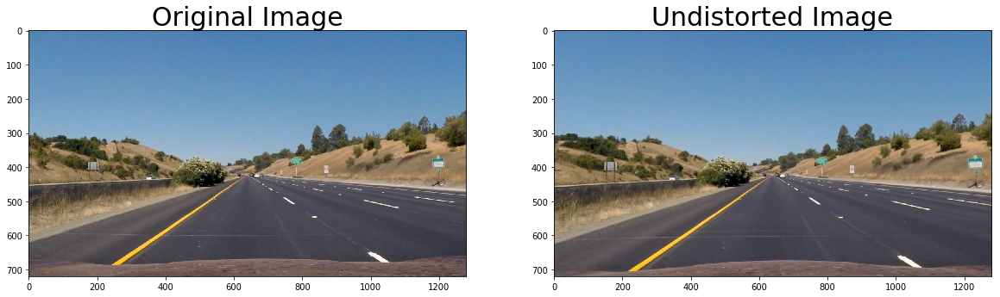

In [8]:

#test_img = mpimg.imread("./test_images/test4.jpg")
test_img = mpimg.imread("./test_images/straight_lines1.jpg")
undist_img = cv2.undistort(test_img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_img)
ax2.set_title('Undistorted Image', fontsize=30)

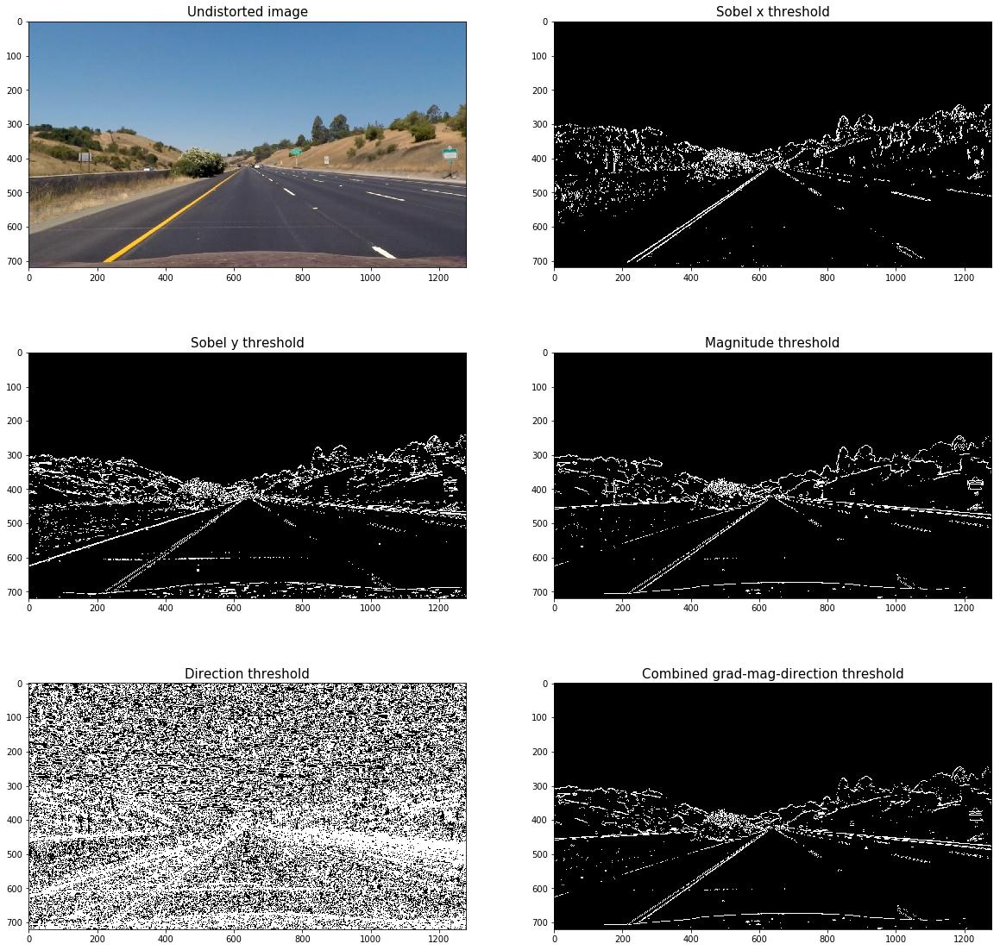

In [9]:
# we'll use the undistorted image from above

gray = grayscale(undist_img)
grad_x_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=9, thresh=(20,100))
grad_y_binary = abs_sobel_thresh(gray, orient='y', sobel_kernel=9, thresh=(20,80))
mag_binary = mag_thresh(gray, sobel_kernel=3, thresh=(40,120))
dir_binary = dir_thresh(gray, sobel_kernel=9, thresh=(0.7, np.pi/2))

fig = plt.figure(figsize=(20,20))

ax = fig.add_subplot(321)
ax.imshow(undist_img)
ax.set_title("Undistorted image", fontsize=15)

ax = fig.add_subplot(322)
ax.imshow(grad_x_binary, cmap="gray")
ax.set_title("Sobel x threshold", fontsize=15)

ax = fig.add_subplot(323)
ax.imshow(grad_y_binary, cmap="gray")
ax.set_title("Sobel y threshold", fontsize=15)

ax = fig.add_subplot(324)
ax.imshow(mag_binary, cmap="gray")
ax.set_title("Magnitude threshold", fontsize=15)

ax = fig.add_subplot(325)
ax.imshow(dir_binary, cmap="gray")
ax.set_title("Direction threshold", fontsize=15)

# combined threshold

comb_grad_mag_dir = np.zeros_like(mag_binary)
comb_grad_mag_dir[((grad_x_binary ==1) & (grad_y_binary == 1)) |
                  ((mag_binary == 1) & (dir_binary == 1))] = 1

ax = fig.add_subplot(326)
ax.imshow(comb_grad_mag_dir, cmap="gray")
ax.set_title("Combined grad-mag-direction threshold", fontsize=15)

#### Color Thresholding

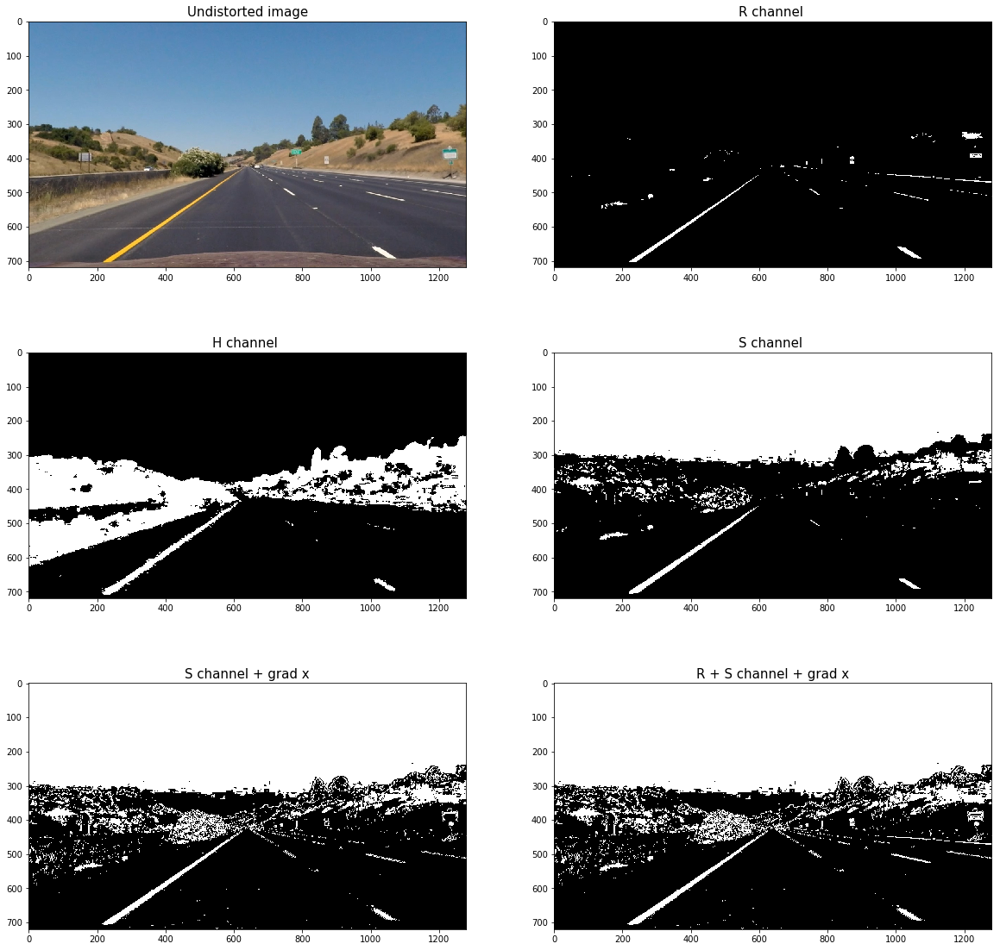

In [10]:

R_ch = undist_img[:,:,0] 
r_binary = color_channel_thresh(R_ch, thresh=(200,255))

# convert undist_img to HLS space and use S channel for color thresholding
hls = cv2.cvtColor(undist_img, cv2.COLOR_RGB2HLS)
H_ch = hls[:,:,0]
L_ch = hls[:,:,1]
S_ch = hls[:,:,2]

h_binary = color_channel_thresh(H_ch, thresh=(15,100))
s_binary = color_channel_thresh(S_ch, thresh = (90,255))

grad_x_binary = abs_sobel_thresh(L_ch, orient='x', sobel_kernel=3, thresh=(20,80))

comb_s_gradx = np.zeros_like(s_binary)
comb_s_gradx[(s_binary == 1) | (grad_x_binary == 1)] = 1

combined = np.zeros_like(s_binary)
combined[(r_binary == 1) | (s_binary == 1) | (grad_x_binary == 1)] = 1

fig = plt.figure(figsize=(20,20))

ax = fig.add_subplot(321)
ax.imshow(undist_img)
ax.set_title("Undistorted image", fontsize=15)

ax = fig.add_subplot(322)
ax.imshow(r_binary, cmap="gray")
ax.set_title("R channel ", fontsize=15)

ax = fig.add_subplot(323)
ax.imshow(h_binary, cmap="gray")
ax.set_title("H channel ", fontsize=15)

ax = fig.add_subplot(324)
ax.imshow(s_binary, cmap="gray")
ax.set_title("S channel ", fontsize=15)

ax = fig.add_subplot(325)
ax.imshow(comb_s_gradx, cmap="gray")
ax.set_title("S channel + grad x", fontsize=15)

ax = fig.add_subplot(326)
ax.imshow(combined, cmap="gray")
ax.set_title("R + S channel + grad x", fontsize=15)

We will be going with R + S_channel and gradient_x thresholding for our pipeline as it gets the best result.


### Perspective Transform

Now that we have undistorted and thresholded the image, we can start working on the perspective transform

In [11]:
# lets load a straight lines image , undistort, threshold and then we can apply perspective transform

# this should go into the pipeline
def temp_pipeline(img, mtx, dist, r_thresh=(200,255),s_thresh=(90,255), 
               gradx_thresh=(20,80), sobel_kernel =3):
    
    undist_img = cv2.undistort(img,mtx, dist, None, mtx)
    
    r_ch = undist_img[:,:,0]
    r_binary = color_channel_thresh(r_ch, thresh=(200,255))
    hls = cv2.cvtColor(undist_img,cv2.COLOR_RGB2HLS)
    l_ch = hls[:,:,1]
    s_ch = hls[:,:,2]
    s_binary = color_channel_thresh(s_ch, s_thresh)
    gradx_binary = abs_sobel_thresh(l_ch, orient='x', sobel_kernel=sobel_kernel, thresh=gradx_thresh)
    
    combined = np.zeros_like(s_binary)
    combined[(r_binary == 1) | (s_binary == 1) | (gradx_binary == 1)] = 1

    return combined

In [12]:
# lets load straight_lines1.jpg and run perspective transform
st_img = mpimg.imread("./test_images/test6.jpg")
#st_img = mpimg.imread("./test_images/straight_lines1.jpg")
print(st_img.shape)
combined_binary = temp_pipeline(st_img, mtx, dist)


(720, 1280, 3)


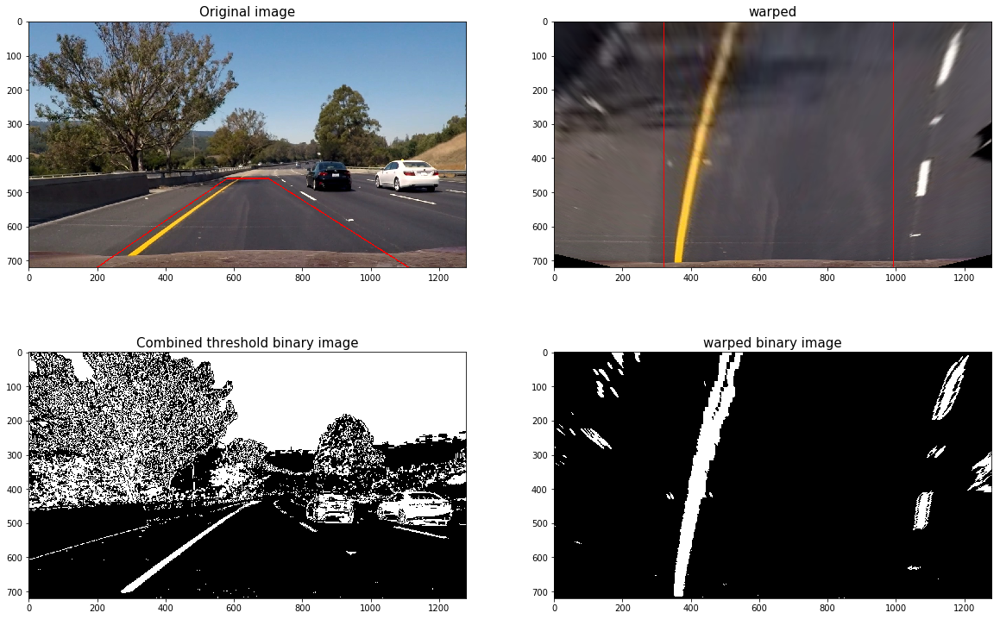

In [13]:
vertices = np.array([[580,460],[700,460],[1110,720],[200,720]])
src = np.float32([vertices])
dest = np.float32([np.array([[320,0],[990,0],[990,720],[320,720]])])
#cv2.polylines(st_img, np.int32([vertices]), isClosed = True, color=[255,0,0], thickness=2)

warped = warp_image(st_img, src, dest) 

fig = plt.figure(figsize=(20,20))

st_img_copy = np.copy(st_img)
cv2.polylines(st_img_copy, np.int32([vertices]), isClosed = True, color=[255,0,0], thickness=2)
ax = fig.add_subplot(321)
ax.imshow(st_img_copy)
ax.set_title("Original image", fontsize=15)

ax = fig.add_subplot(322)
warped_copy=np.copy(warped)
cv2.polylines(warped_copy, np.int32([dest]), isClosed = True, color=[255,0,0], thickness=2)
ax.imshow(warped_copy)
ax.set_title("warped", fontsize=15)


# warp the binary image with src and dest points
warped_binary = warp_image(combined_binary, src, dest) 

ax = fig.add_subplot(323)
ax.imshow(combined_binary, cmap="gray")
ax.set_title("Combined threshold binary image", fontsize=15)

ax = fig.add_subplot(324)
ax.imshow(warped_binary, cmap='gray')
ax.set_title("warped binary image", fontsize=15)





### Finding Lane Lines

##### Sliding Window Method:

Take histogram of the bottom half of the image and find the left and right lane lines by finding the max histogram in the left and right halves.


Define a Line Class 




In [15]:
def find_lane_x_bases(warped_binary, debug=False) :
    """
    This method does takes in a binary image and identifies x positions of left and right lanes
    @return (leftx_base, rightx_base)
    """
    # take the lower half of the image
    y_mid = np.int(warped_binary.shape[0]/2);
    warped_binary_lower = warped_binary[y_mid:,:]
    
    # create a histogram of the image
    histogram = np.sum(warped_binary_lower, axis=0)
    x_mid = np.int(warped_binary.shape[1]/2)
    # the point where the left half of histogram has max value is the left lane x base
    leftx_base = np.argmax(histogram[0:x_mid])
    # the point where the right half of histogram has max value is the right lane x base
    rightx_base = np.argmax(histogram[x_mid:]) + x_mid
    
    if debug : 
        plt.subplot(211),plt.imshow(warped_binary_lower,cmap='gray')
        plt.subplot(212),plt.plot(histogram)
    
    return(leftx_base, rightx_base)

def sliding_window(warped_binary, nonzeros_x, nonzeros_y, margin, debug=False) :
    """
    Sliding window method that moves 2 sliding windows from the bottom to the top to 
    find the left and right lanes.
    """
    if debug :
        out_img = np.dstack((warped_binary, warped_binary, warped_binary))*255

    #initialize leftx and rightx by finding the two x positions for left and right lanes
    leftx_cur, rightx_cur = find_lane_x_bases(warped_binary)
    
    # initialize number of sliding windows
    num_windows=9
    #initialize sliding window height
    win_height = np.int(warped_binary.shape[0] / num_windows)
    #min number of pixels in sliding window to decide if we have to recenter window
    min_pixels = 50

    # initilize lists to hold all left lane and right lane pixel indices 
    left_lane_inds=[]
    right_lane_inds=[]
    
    # loop sliding window logic
    for window in range (num_windows) :
        # compute sliding window boundaries
        # since y increaseas as we go down win_y_high will represent the bottom of the sliding window 
        win_y_high = warped_binary.shape[0] - window * win_height # when window = 0 win_y_high will be the y_max of the image
        win_y_low = win_y_high - win_height
        win_xleft_low = leftx_cur - margin
        win_xleft_high = leftx_cur + margin
        win_xright_low = rightx_cur - margin
        win_xright_high = rightx_cur + margin

        # find all the left lane pixel indices within the current window
        # Note: the boolean array from teh 4 & conditions below will be the same size as nonzeros_x(y) 
        # and will contain true where all pixels are within the sliding window.  Now taking nonzero() 
        # on this  boolean array will gives u the indexes of only the True values in teh array, 
        # effectively giving us the indexes of the non-zero pixels in the sliding window
        good_left_inds =  ((nonzeros_y >= win_y_low) &(nonzeros_y < win_y_high) 
                           &(nonzeros_x >= win_xleft_low) & (nonzeros_x< win_xleft_high )).nonzero()[0]
        good_right_inds = ((nonzeros_y >= win_y_low) &(nonzeros_y < win_y_high) 
                           &(nonzeros_x >= win_xright_low) & (nonzeros_x < win_xright_high) ).nonzero()[0]

        # append to list to collect all indices of nonzero pixels in the sliding window path
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # if pixels in the window are greater than min pix then move the center of the 
        # next window to the mean of the pixels x values
        if len(good_left_inds) > min_pixels :
            leftx_cur = np.int(np.mean(nonzeros_x[good_left_inds]))
        if len(good_right_inds) > min_pixels :
            rightx_cur = np.int(np.mean(nonzeros_x[good_right_inds]))
            
        if debug :
            cv2.rectangle(out_img, (win_xleft_low, win_y_low),(win_xleft_high, win_y_high), 
                          color=(0,255,0), thickness=5)
            cv2.rectangle(out_img, (win_xright_low, win_y_low),(win_xright_high, win_y_high), 
                          color=(0,255,0), thickness=5)
    
    if debug :
        plt.imshow(out_img)
        
    left_lane_inds= np.concatenate(left_lane_inds)
    right_lane_inds= np.concatenate(right_lane_inds)
    
    return (left_lane_inds,right_lane_inds)

(377, 1076)

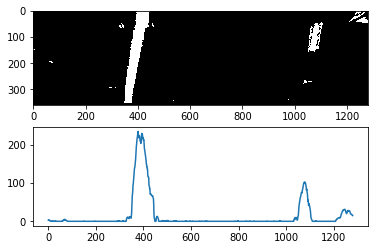

In [16]:
find_lane_x_bases(warped_binary, debug=True)

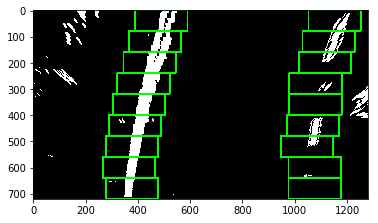

In [17]:

# sliding window width from the center (base-margin, base + margin)
margin=100

# find all non-zero pixels from the image. The nonzero function returns a tuple of 2 arrays, each one representing the 
# x and y positions of the non_zero pixels. 
nonzeros= warped_binary.nonzero()
nonzeros_x = nonzeros[1]
nonzeros_y = nonzeros[0]
#Note: nonzeros_x and nonzeros_y will have the same length , equal to the number of nonzero pixels in the image
# If the first non_zero pixel is at 2,1020 then nonzeros_x[0] = 1020 and nonzeros_y[0] = 2

left_lane_inds, right_lane_inds = sliding_window(warped_binary, nonzeros_x, nonzeros_y, margin, debug=True)

In [69]:
# Class to store left and right lane lines
class Line() :
    def __init__(self, n=5) :
        
        # n value - determining number of iterations to keep track odd
        self.n = n
        
        # Maximum Consec failures constant
        self.MAX_CONSEC_FAILURES=5
        
        # number of consec failures (use this to determine when to run the sliding window). 
        self.consec_failures = 0
        
        # x values of the last n fits of the line
        self.recent_xfitted = None 
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        
        #polynomial coefficients for the recent n fit
        self.recent_fit_coeff = None  
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit_coeff = None  
        

        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        
        #y values for detected line pixels
        self.ally = None
        
    def _add_xfit(self, xfit) :
        if self.recent_xfitted is None :
            self.recent_xfitted = xfit
        else :
            # add to the end of previous x fit with vstack
            self.recent_xfitted = np.vstack((self.recent_xfitted, xfit))
            # if we whave more than n fits stored then just keep the last n_fits
            
            if len(self.recent_xfitted) > self.n :
                self.recent_xfitted = self.recent_xfitted[-self.n:]

        # update best_x with mean of the recent_xfitted values
        if len(self.recent_xfitted.shape) == 1 :
            self.bestx = self.recent_xfitted
        else :
            self.bestx = np.mean(self.recent_xfitted, axis=0)
    
    def _add_fit_coeff(self, fit_coeff) :
        if self.recent_fit_coeff is None :
            self.recent_fit_coeff = fit_coeff
        else :
            # add to the end of previous coeff fit with vstack
            self.recent_fit_coeff = np.vstack((self.recent_fit_coeff, fit_coeff))
            # if we whave more than n fits stored then just keep the last n_fits
            if len(self.recent_fit_coeff) > self.n :
                self.recent_fit_coeff = self.recent_fit_coeff[-self.n:]

        # update best_x with mean of the recent_xfitted values
        if len(self.recent_fit_coeff.shape) ==  1 :
            self.best_fit_coeff = self.recent_fit_coeff
        else :
            self.best_fit_coeff = np.mean(self.recent_fit_coeff, axis=0)
    
    
    def get_last_xfit(self) :
        # if recent_xfitted is not defined or it has only one row return it, else return last element
        if (self.recent_xfitted is None) or (len(self.recent_xfitted.shape)== 1 ):
            return self.recent_xfitted

        return self.recent_xfitted[-1]
    
    def get_last_fit_coeff(self) :
        # if recent_fit_coeff is none or it has only one row return it, else return last element
        if (self.recent_fit_coeff is None) or (len(self.recent_fit_coeff.shape)== 1 ):
            return self.recent_fit_coeff

        return self.recent_fit_coeff[-1]
        
    def update(self, xfit, fit_coeff, roc) :
        self._add_xfit(xfit)
        self._add_fit_coeff(fit_coeff)
        self.radius_of_curvature = roc
    
    def needs_sliding_window(self) :
        return self.recent_xfitted is None or self.consec_failures > self.MAX_CONSEC_FAILURES
            
        

###### find lanes method that uses sliding window or previous polyfits to identify lane lines

In [148]:
def radius_of_curvature(y,fit) :
    # x= A*y**2 + B*y + C
    # rad = (( 1+ (dx/dy)**2)**1.5) / (abs(d2x/dy2)) 
    # dx/dy = 2Ay + B,    d2x/dy2  = 2A
    rad = ((1 + (2*fit[0]* y + fit[1])**2)**1.5) / np.abs(2 * fit[0])
    return rad

def good_lanes(left_fitx, right_fitx, left_roc, right_roc) :
    
    # TODO put code to check if the lines are parallel (what to do with roc?)
    
    return True

def find_lane_lines(warped_binary, left_line_obj, right_line_obj) :
    nonzeros = warped_binary.nonzero()
    nonzeros_y = np.array(nonzeros[0])
    nonzeros_x = np.array(nonzeros[1])
    margin = 100
    
    if left_line_obj.needs_sliding_window() or right_line_obj.needs_sliding_window() :
        left_lane_inds, right_lane_inds = sliding_window(warped_binary,nonzeros_x, nonzeros_y, margin)
    else :
        # get the best fit coeffs from the fit values in object
        left_fit = left_line_obj.best_fit_coeff
        left_lane_inds = ((nonzeros_x > (left_fit[0]*(nonzeros_y**2) + left_fit[1]*nonzeros_y + left_fit[2] - margin)) 
                  & (nonzeros_x < (left_fit[0]*(nonzeros_y**2) + left_fit[1]*nonzeros_y + left_fit[2] + margin)))
        
        right_fit = right_line_obj.best_fit_coeff
        right_lane_inds = ((nonzeros_x > (right_fit[0]*(nonzeros_y**2) + right_fit[1]*nonzeros_y + right_fit[2] - margin)) 
                   & (nonzeros_x < (right_fit[0]*(nonzeros_y**2) + right_fit[1]*nonzeros_y + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzeros_x[left_lane_inds]
    lefty = nonzeros_y[left_lane_inds] 
    rightx = nonzeros_x[right_lane_inds]
    righty = nonzeros_y[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary.shape[0]-1, warped_binary.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # compute radius of curvature
    y_eval = np.max(ploty)
    left_roc = radius_of_curvature(y_eval, left_fit)  
    right_roc = radius_of_curvature(y_eval, right_fit)
    
    print("left_line_obj.best_fit_coeff : ", left_line_obj.best_fit_coeff)
    print("left_fit coeff               : ", left_fit)
    print("right_line_obj.best_fit_coeff : ", right_line_obj.best_fit_coeff)
    print("right_fit coeff               : ", right_fit,"\n")
    # sanity check TODO
    if good_lanes(left_fitx, right_fitx, left_roc, right_roc) :
        left_line_obj.update(left_fitx,left_fit, left_roc)
        right_line_obj.update(right_fitx, right_fit, right_roc)
    
    

In [72]:
def pipeline(input_image, mtx, dist, left_line_obj, right_line_obj, 
             r_thresh=(200,255),s_thresh=(90,255), gradx_thresh=(20,80), sobel_kernel =3):
    # undistor image
    undist_img = cv2.undistort(input_image,mtx, dist, None, mtx)
    
    #thresholding
    r_ch = undist_img[:,:,0]
    r_binary = color_channel_thresh(r_ch, thresh=r_thresh)
    hls = cv2.cvtColor(undist_img,cv2.COLOR_RGB2HLS)
    l_ch = hls[:,:,1]
    s_ch = hls[:,:,2]
    s_binary = color_channel_thresh(s_ch, s_thresh)
    gradx_binary = abs_sobel_thresh(l_ch, orient='x', sobel_kernel=sobel_kernel, thresh=gradx_thresh)
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(r_binary == 1) | (s_binary == 1) | (gradx_binary == 1)] = 1

    # warp thresholded image
    vertices = np.array([[580,460],[700,460],[1110,720],[200,720]])
    src = np.float32([vertices])
    dest = np.float32([np.array([[320,0],[990,0],[990,720],[320,720]])])
    warped_binary = warp_image(combined_binary, src, dest) 

    # update left_line_obj and right_line_obj with lines for image
    find_lane_lines(warped_binary, left_line_obj, right_line_obj)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, warped_binary.shape[0]-1, warped_binary.shape[0] )
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_line_obj.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line_obj.bestx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = unwarp_image(color_warp, src, dest)
    # Combine the result with the original image
    return cv2.addWeighted(undist_img, 1, newwarp, 0.3, 0)
    


  



In [133]:
#Create the 2 line objects
left_line_obj = Line()
right_line_obj = Line()

left_line_obj.best_fit_coeff :  None
left_fit coeff               :  [  7.61602610e-05  -1.78603974e-02   3.47504084e+02]
right_line_obj.best_fit_coeff :  None
right_fit coeff               :  [ -9.93806187e-05  -1.70705916e-01   1.15273270e+03] 

left_line_obj.best_fit_coeff :  [  7.61602610e-05  -1.78603974e-02   3.47504084e+02]
left_fit coeff               :  [ -2.47775108e-04   3.37524885e-01   2.70623934e+02]
right_line_obj.best_fit_coeff :  [ -9.93806187e-05  -1.70705916e-01   1.15273270e+03]
right_fit coeff               :  [ -4.75030561e-04   4.27499807e-01   9.37274628e+02] 

left_line_obj.best_fit_coeff :  [ -8.58074233e-05   1.59832244e-01   3.09064009e+02]
left_fit coeff               :  [ -1.66145932e-05  -1.54683496e-01   4.62488881e+02]
right_line_obj.best_fit_coeff :  [ -2.87205590e-04   1.28396946e-01   1.04500366e+03]
right_fit coeff               :  [  1.42701722e-04  -3.02292701e-01   1.15567829e+03] 

left_line_obj.best_fit_coeff :  [ -6.27431466e-05   5.49936641e-

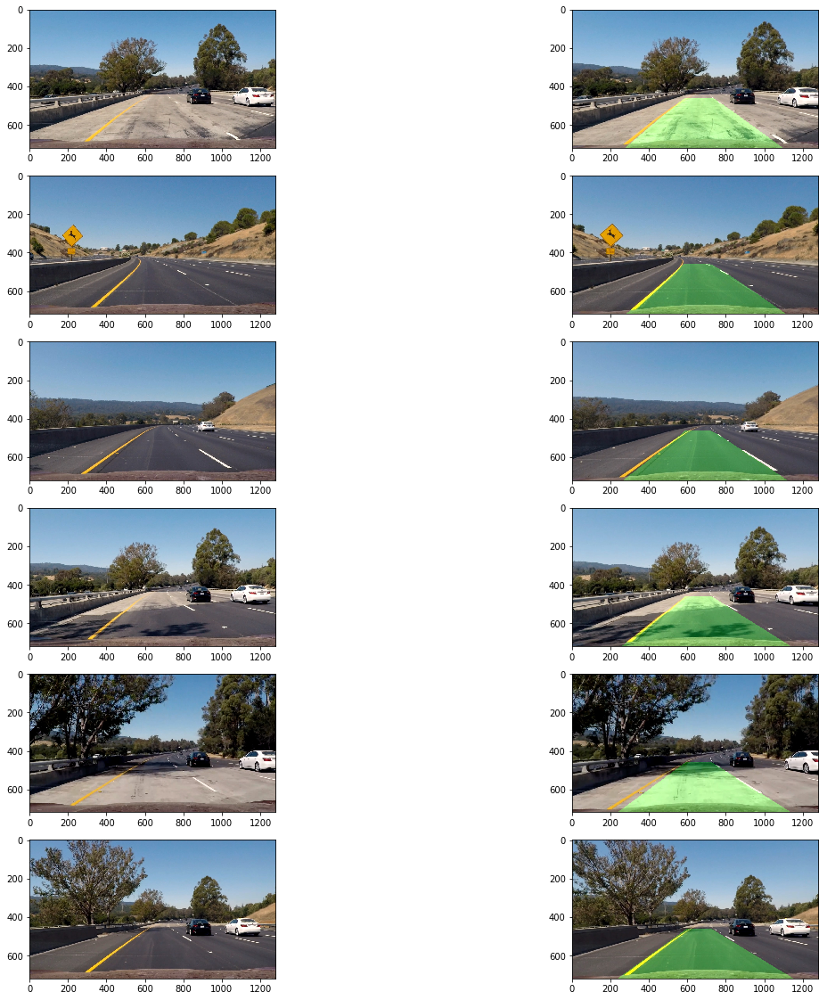

In [156]:
fnames = glob.glob('./test_images/test*.jpg')
f,ax = plt.subplots(len(fnames),2,figsize=(20,20))
left_line_obj = Line()
right_line_obj = Line()
for i, fname in enumerate(fnames) :
    input_img = mpimg.imread(fname)
    lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
    ax[i,0].imshow(input_img)
    ax[i,1].imshow(lane_image)


left_line_obj.best_fit_coeff :  None
left_fit coeff               :  [ -2.67206695e-04   3.39698141e-01   2.71168690e+02]
right_line_obj.best_fit_coeff :  None
right_fit coeff               :  [ -1.64290632e-04   2.58746759e-01   9.55362002e+02] 

left_line_obj.best_fit_coeff :  [ -2.67206695e-04   3.39698141e-01   2.71168690e+02]
left_fit coeff               :  [ -1.70199332e-04   3.00265681e-01   2.46006379e+02]
right_line_obj.best_fit_coeff :  [ -1.64290632e-04   2.58746759e-01   9.55362002e+02]
right_fit coeff               :  [ -1.65999634e-04   2.82228574e-01   9.29232244e+02] 

left_line_obj.best_fit_coeff :  [ -2.18703013e-04   3.19981911e-01   2.58587534e+02]
left_fit coeff               :  [ -2.29388923e-04   3.38880078e-01   2.06742972e+02]
right_line_obj.best_fit_coeff :  [ -1.65145133e-04   2.70487666e-01   9.42297123e+02]
right_fit coeff               :  [ -1.51045417e-04   3.25623403e-01   8.50071675e+02] 

left_line_obj.best_fit_coeff :  [ -2.22264983e-04   3.26281300e-

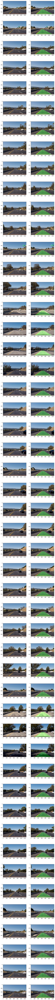

In [158]:
fnames = glob.glob('./debug_images/video1*.jpg')
f,ax = plt.subplots(len(fnames),2,figsize=(10,200))
left_line_obj = Line()
right_line_obj = Line()
for i, fname in enumerate(fnames) :
    input_img = mpimg.imread(fname)
    lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
    ax[i,0].imshow(input_img)
    ax[i,1].imshow(lane_image)


In [ ]:
# Create an image to draw on and an image to show the selection window


In [142]:
len(left_line_obj.recent_xfitted.shape)

2

In [79]:
left_line_obj.recent_xfitted.shape

(4, 720)

(720, 1280, 3)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f1c909b3b00>,
 <matplotlib.image.AxesImage at 0x7f1c908dd358>)

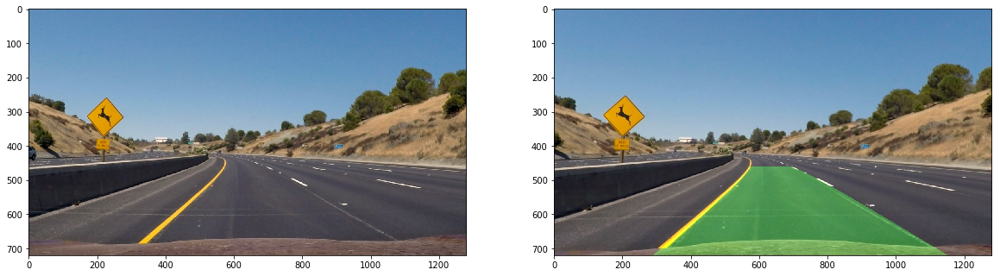

In [115]:
left_line_obj = Line()
right_line_obj = Line()
input_img = mpimg.imread("./test_images/test2.jpg")
#st_img = mpimg.imread("./test_images/straight_lines1.jpg")
print(input_img.shape)

lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(input_img)
plt.subplot(222), plt.imshow(lane_image)

(720, 1280, 3)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f1c9089f0b8>,
 <matplotlib.image.AxesImage at 0x7f1c90838320>)

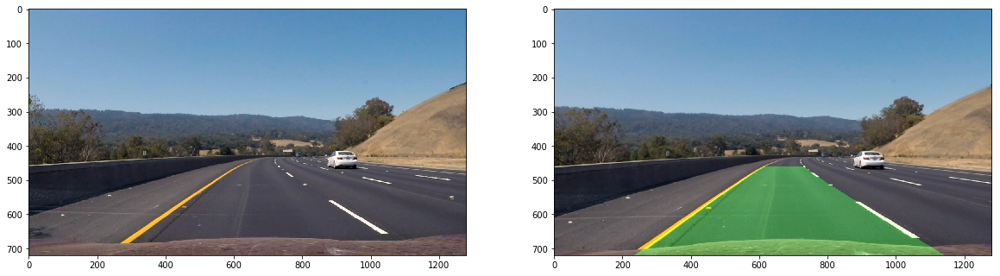

In [116]:
left_line_obj = Line()
right_line_obj = Line()
input_img = mpimg.imread("./test_images/test3.jpg")
#st_img = mpimg.imread("./test_images/straight_lines1.jpg")
print(input_img.shape)

lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(input_img)
plt.subplot(222), plt.imshow(lane_image)

(720, 1280, 3)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f1c904a0898>,
 <matplotlib.image.AxesImage at 0x7f1c903db6a0>)

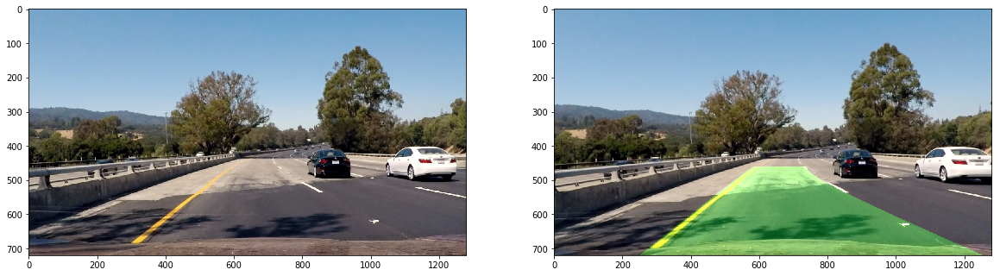

In [121]:
left_line_obj = Line()
right_line_obj = Line()
input_img = mpimg.imread("./test_images/test4.jpg")
print(input_img.shape)

lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(input_img)
plt.subplot(222), plt.imshow(lane_image)

(720, 1280, 3)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f1c9060b5f8>,
 <matplotlib.image.AxesImage at 0x7f1c905ae208>)

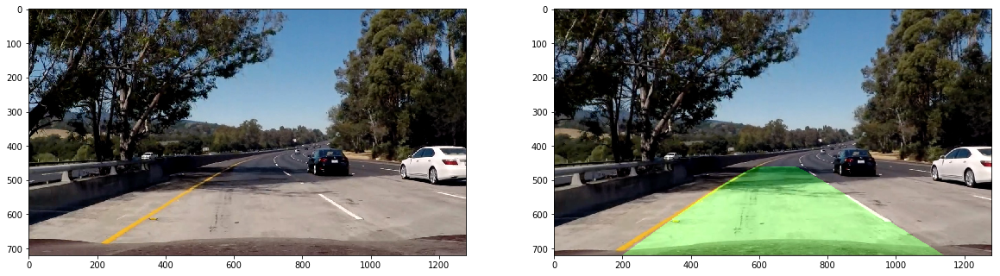

In [119]:
left_line_obj = Line()
right_line_obj = Line()
input_img = mpimg.imread("./test_images/test5.jpg")
#st_img = mpimg.imread("./test_images/straight_lines1.jpg")
print(input_img.shape)

lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(input_img)
plt.subplot(222), plt.imshow(lane_image)

(720, 1280, 3)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f1c902ec2b0>,
 <matplotlib.image.AxesImage at 0x7f1c90203b38>)

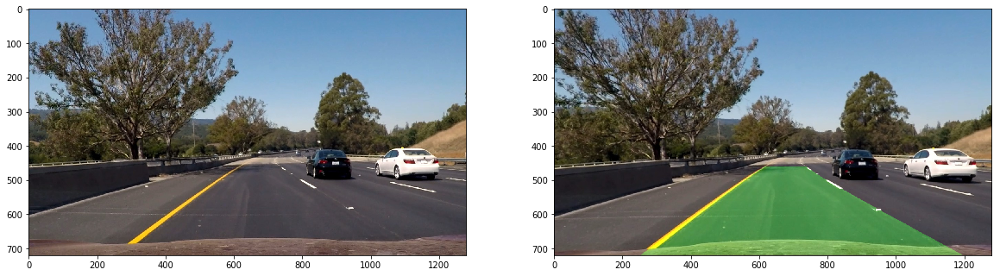

In [123]:
left_line_obj = Line()
right_line_obj = Line()
input_img = mpimg.imread("./test_images/test6.jpg")
#st_img = mpimg.imread("./test_images/straight_lines1.jpg")
print(input_img.shape)

lane_image = pipeline(input_img, mtx, dist, left_line_obj,right_line_obj )
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(input_img)
plt.subplot(222), plt.imshow(lane_image)

In [124]:
print(left_line_obj.best_fit_coeff)

[  1.31124446e-04  -3.25726592e-01   5.24877622e+02]


In [85]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [109]:
left_line_obj = Line()
right_line_obj = Line()

def process_image(image):
    result = pipeline(image, mtx,dist, left_line_obj, right_line_obj )
    return result


In [96]:
project_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
result_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time result_clip.write_videofile(project_output, audio=False)

mtx: shape (3, 3)
dist: shape (1, 5)
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  0%|          | 1/1261 [00:00<02:37,  8.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  0%|          | 2/1261 [00:00<02:57,  7.11it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  0%|          | 3/1261 [00:00<02:59,  6.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  0%|          | 4/1261 [00:00<02:53,  7.26it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  0%|          | 5/1261 [00:00<02:47,  7.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  0%|          | 6/1261 [00:00<02:54,  7.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  1%|          | 7/1261 [00:00<02:50,  7.34it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  1%|          | 8/1261 [00:01<02:45,  7.57it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  1%|          | 10/1261 [00:01<03:14,  6.43it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  1%|          | 12/1261 [00:01<03:05,  6.73it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  1%|          | 14/1261 [00:02<03:07,  6.64it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  1%|▏         | 16/1261 [00:02<03:12,  6.48it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  1%|▏         | 18/1261 [00:02<03:29,  5.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 19/1261 [00:02<03:35,  5.75it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 21/1261 [00:03<04:14,  4.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 22/1261 [00:03<04:21,  4.75it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 23/1261 [00:03<04:11,  4.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 25/1261 [00:04<03:48,  5.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 27/1261 [00:04<03:06,  6.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  2%|▏         | 29/1261 [00:04<02:51,  7.18it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 32/1261 [00:04<02:28,  8.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 33/1261 [00:05<02:27,  8.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 35/1261 [00:05<02:25,  8.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 38/1261 [00:05<02:14,  9.07it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 39/1261 [00:05<02:13,  9.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 41/1261 [00:05<02:16,  8.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  3%|▎         | 43/1261 [00:06<02:12,  9.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  4%|▎         | 45/1261 [00:06<02:34,  7.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  4%|▍         | 48/1261 [00:06<02:26,  8.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  4%|▍         | 49/1261 [00:06<02:25,  8.35it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  4%|▍         | 51/1261 [00:07<02:20,  8.59it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  4%|▍         | 53/1261 [00:07<02:29,  8.07it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  4%|▍         | 55/1261 [00:07<02:25,  8.31it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▍         | 57/1261 [00:07<02:35,  7.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▍         | 59/1261 [00:08<02:29,  8.05it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▍         | 61/1261 [00:08<02:30,  8.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▍         | 63/1261 [00:08<02:26,  8.20it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▌         | 65/1261 [00:08<02:26,  8.14it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▌         | 67/1261 [00:09<02:25,  8.23it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  5%|▌         | 69/1261 [00:09<02:35,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  6%|▌         | 71/1261 [00:09<02:26,  8.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  6%|▌         | 73/1261 [00:09<02:30,  7.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  6%|▌         | 75/1261 [00:10<02:25,  8.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  6%|▌         | 77/1261 [00:10<02:22,  8.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  6%|▋         | 79/1261 [00:10<02:31,  7.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  6%|▋         | 81/1261 [00:10<02:39,  7.42it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  7%|▋         | 83/1261 [00:11<02:29,  7.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  7%|▋         | 85/1261 [00:11<02:56,  6.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  7%|▋         | 87/1261 [00:11<02:51,  6.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  7%|▋         | 89/1261 [00:12<02:38,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  7%|▋         | 91/1261 [00:12<02:35,  7.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  7%|▋         | 93/1261 [00:12<02:24,  8.06it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 95/1261 [00:12<02:31,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 96/1261 [00:13<02:37,  7.40it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 98/1261 [00:13<03:15,  5.95it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 100/1261 [00:13<03:13,  5.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 102/1261 [00:14<03:08,  6.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 104/1261 [00:14<03:15,  5.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  8%|▊         | 106/1261 [00:14<03:06,  6.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  9%|▊         | 108/1261 [00:15<03:29,  5.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  9%|▊         | 110/1261 [00:15<03:12,  5.97it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  9%|▉         | 112/1261 [00:15<03:06,  6.15it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  9%|▉         | 114/1261 [00:16<03:10,  6.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  9%|▉         | 116/1261 [00:16<02:51,  6.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


  9%|▉         | 118/1261 [00:16<02:53,  6.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|▉         | 120/1261 [00:17<02:52,  6.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|▉         | 122/1261 [00:17<02:43,  6.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|▉         | 124/1261 [00:17<03:06,  6.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|▉         | 126/1261 [00:18<03:17,  5.76it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|█         | 128/1261 [00:18<03:03,  6.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|█         | 130/1261 [00:18<03:20,  5.64it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 10%|█         | 132/1261 [00:19<03:05,  6.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█         | 134/1261 [00:19<02:49,  6.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█         | 136/1261 [00:19<02:32,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█         | 138/1261 [00:19<02:31,  7.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█         | 139/1261 [00:19<02:47,  6.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█         | 141/1261 [00:20<03:21,  5.55it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█▏        | 142/1261 [00:20<03:16,  5.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█▏        | 143/1261 [00:20<03:48,  4.89it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█▏        | 144/1261 [00:21<03:57,  4.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 11%|█▏        | 145/1261 [00:21<03:57,  4.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 12%|█▏        | 147/1261 [00:21<03:49,  4.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 12%|█▏        | 149/1261 [00:21<03:00,  6.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 12%|█▏        | 151/1261 [00:22<03:01,  6.12it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 12%|█▏        | 153/1261 [00:22<02:49,  6.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 12%|█▏        | 155/1261 [00:22<02:42,  6.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 12%|█▏        | 157/1261 [00:23<02:37,  7.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 13%|█▎        | 159/1261 [00:23<02:36,  7.05it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 13%|█▎        | 161/1261 [00:23<02:47,  6.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 13%|█▎        | 163/1261 [00:23<02:26,  7.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 13%|█▎        | 165/1261 [00:24<02:18,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 13%|█▎        | 167/1261 [00:24<02:29,  7.34it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 13%|█▎        | 169/1261 [00:24<02:26,  7.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 14%|█▎        | 171/1261 [00:25<02:19,  7.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 14%|█▎        | 173/1261 [00:25<02:23,  7.60it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 14%|█▍        | 175/1261 [00:25<02:20,  7.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 14%|█▍        | 177/1261 [00:25<02:24,  7.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 14%|█▍        | 179/1261 [00:26<02:14,  8.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 14%|█▍        | 181/1261 [00:26<02:24,  7.45it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▍        | 183/1261 [00:26<02:37,  6.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▍        | 185/1261 [00:26<02:47,  6.42it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▍        | 187/1261 [00:27<02:39,  6.73it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▍        | 189/1261 [00:27<02:34,  6.95it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▌        | 191/1261 [00:27<02:27,  7.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▌        | 193/1261 [00:28<02:41,  6.61it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 15%|█▌        | 195/1261 [00:28<02:54,  6.12it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 16%|█▌        | 197/1261 [00:28<02:44,  6.46it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 16%|█▌        | 199/1261 [00:29<02:33,  6.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 16%|█▌        | 201/1261 [00:29<02:27,  7.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 16%|█▌        | 203/1261 [00:29<02:18,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 16%|█▋        | 205/1261 [00:29<02:18,  7.61it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 16%|█▋        | 207/1261 [00:30<02:27,  7.15it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 17%|█▋        | 209/1261 [00:30<02:21,  7.43it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 17%|█▋        | 211/1261 [00:30<02:12,  7.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 17%|█▋        | 213/1261 [00:30<02:18,  7.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 17%|█▋        | 215/1261 [00:31<02:10,  8.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 17%|█▋        | 217/1261 [00:31<02:16,  7.64it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 17%|█▋        | 219/1261 [00:31<02:16,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 221/1261 [00:31<02:14,  7.73it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 223/1261 [00:32<02:17,  7.54it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 225/1261 [00:32<02:15,  7.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 227/1261 [00:32<02:14,  7.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 229/1261 [00:33<02:18,  7.48it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 231/1261 [00:33<02:13,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 18%|█▊        | 233/1261 [00:33<02:08,  8.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 19%|█▊        | 235/1261 [00:33<02:13,  7.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 19%|█▉        | 237/1261 [00:34<02:12,  7.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 19%|█▉        | 239/1261 [00:34<02:12,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 19%|█▉        | 241/1261 [00:34<02:07,  8.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 19%|█▉        | 243/1261 [00:34<02:09,  7.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 19%|█▉        | 245/1261 [00:35<02:11,  7.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 20%|█▉        | 247/1261 [00:35<02:09,  7.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 20%|█▉        | 249/1261 [00:35<02:06,  8.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 20%|█▉        | 251/1261 [00:35<02:08,  7.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 20%|██        | 253/1261 [00:36<02:11,  7.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 20%|██        | 255/1261 [00:36<02:07,  7.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 20%|██        | 257/1261 [00:36<02:24,  6.96it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██        | 259/1261 [00:36<02:12,  7.55it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██        | 261/1261 [00:37<02:11,  7.62it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██        | 263/1261 [00:37<02:15,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██        | 265/1261 [00:37<02:25,  6.82it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██        | 267/1261 [00:38<02:18,  7.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██▏       | 269/1261 [00:38<02:14,  7.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 21%|██▏       | 271/1261 [00:38<02:08,  7.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 22%|██▏       | 273/1261 [00:38<02:10,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 22%|██▏       | 275/1261 [00:39<02:28,  6.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 22%|██▏       | 277/1261 [00:39<02:49,  5.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 22%|██▏       | 278/1261 [00:39<03:00,  5.45it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 22%|██▏       | 280/1261 [00:39<02:32,  6.41it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 22%|██▏       | 282/1261 [00:40<02:29,  6.54it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 284/1261 [00:40<02:12,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 286/1261 [00:40<02:13,  7.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 288/1261 [00:41<02:04,  7.82it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 290/1261 [00:41<02:13,  7.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 292/1261 [00:41<02:10,  7.42it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 294/1261 [00:41<02:12,  7.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 23%|██▎       | 296/1261 [00:42<02:15,  7.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 24%|██▎       | 298/1261 [00:42<02:13,  7.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 24%|██▍       | 300/1261 [00:42<02:01,  7.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 24%|██▍       | 302/1261 [00:42<02:03,  7.77it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 24%|██▍       | 304/1261 [00:43<02:00,  7.97it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 24%|██▍       | 306/1261 [00:43<02:03,  7.75it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 24%|██▍       | 308/1261 [00:43<01:59,  7.95it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 25%|██▍       | 310/1261 [00:43<02:00,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 25%|██▍       | 312/1261 [00:44<01:58,  8.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 25%|██▍       | 314/1261 [00:44<01:59,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 25%|██▌       | 316/1261 [00:44<02:03,  7.68it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 25%|██▌       | 318/1261 [00:44<01:53,  8.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 25%|██▌       | 320/1261 [00:45<01:56,  8.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▌       | 322/1261 [00:45<01:49,  8.54it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▌       | 324/1261 [00:45<02:05,  7.46it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▌       | 326/1261 [00:46<02:26,  6.39it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▌       | 328/1261 [00:46<02:07,  7.34it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▌       | 330/1261 [00:46<02:09,  7.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▋       | 332/1261 [00:46<02:06,  7.34it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 26%|██▋       | 334/1261 [00:47<02:07,  7.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 27%|██▋       | 336/1261 [00:47<01:59,  7.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 27%|██▋       | 338/1261 [00:47<02:01,  7.61it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 27%|██▋       | 340/1261 [00:47<01:57,  7.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 27%|██▋       | 342/1261 [00:48<02:04,  7.36it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 27%|██▋       | 344/1261 [00:48<02:18,  6.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 27%|██▋       | 346/1261 [00:48<02:21,  6.46it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 28%|██▊       | 348/1261 [00:49<02:06,  7.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 28%|██▊       | 350/1261 [00:49<02:09,  7.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 28%|██▊       | 352/1261 [00:49<01:58,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 28%|██▊       | 354/1261 [00:49<02:08,  7.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 28%|██▊       | 356/1261 [00:50<01:58,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 28%|██▊       | 358/1261 [00:50<02:00,  7.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 29%|██▊       | 360/1261 [00:50<01:57,  7.68it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 29%|██▊       | 362/1261 [00:50<01:59,  7.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 29%|██▉       | 364/1261 [00:51<01:56,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 29%|██▉       | 366/1261 [00:51<02:09,  6.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 29%|██▉       | 368/1261 [00:51<02:04,  7.15it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 29%|██▉       | 370/1261 [00:52<02:09,  6.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|██▉       | 372/1261 [00:52<01:58,  7.53it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|██▉       | 374/1261 [00:52<01:53,  7.79it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|██▉       | 376/1261 [00:52<01:55,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|██▉       | 378/1261 [00:53<01:59,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|███       | 380/1261 [00:53<01:54,  7.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|███       | 382/1261 [00:53<01:50,  7.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 30%|███       | 384/1261 [00:53<01:54,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 31%|███       | 386/1261 [00:54<01:53,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 31%|███       | 388/1261 [00:54<01:52,  7.78it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 31%|███       | 390/1261 [00:54<01:58,  7.34it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 31%|███       | 392/1261 [00:54<01:55,  7.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 31%|███       | 394/1261 [00:55<02:00,  7.22it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 31%|███▏      | 396/1261 [00:55<02:08,  6.75it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 32%|███▏      | 398/1261 [00:55<02:12,  6.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 32%|███▏      | 400/1261 [00:56<02:07,  6.76it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 32%|███▏      | 402/1261 [00:56<02:10,  6.57it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 32%|███▏      | 404/1261 [00:56<02:17,  6.22it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 32%|███▏      | 406/1261 [00:57<02:31,  5.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 32%|███▏      | 408/1261 [00:57<02:10,  6.54it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 410/1261 [00:57<02:00,  7.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 412/1261 [00:58<02:07,  6.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 414/1261 [00:58<02:03,  6.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 415/1261 [00:58<02:04,  6.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 416/1261 [00:58<02:23,  5.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 418/1261 [00:59<02:46,  5.06it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 419/1261 [00:59<02:43,  5.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 33%|███▎      | 421/1261 [00:59<02:23,  5.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 34%|███▎      | 423/1261 [00:59<02:13,  6.27it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 34%|███▎      | 425/1261 [01:00<02:32,  5.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 34%|███▍      | 427/1261 [01:00<02:51,  4.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 34%|███▍      | 429/1261 [01:01<02:18,  6.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 34%|███▍      | 431/1261 [01:01<02:15,  6.12it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 34%|███▍      | 433/1261 [01:01<02:27,  5.61it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 34%|███▍      | 435/1261 [01:02<02:36,  5.27it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)

 35%|███▍      | 437/1261 [01:02<02:21,  5.83it/s]


mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 35%|███▍      | 439/1261 [01:02<02:20,  5.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 35%|███▍      | 441/1261 [01:03<02:43,  5.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 35%|███▌      | 443/1261 [01:03<02:21,  5.78it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 35%|███▌      | 445/1261 [01:03<02:00,  6.76it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 35%|███▌      | 447/1261 [01:04<01:54,  7.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 36%|███▌      | 449/1261 [01:04<02:01,  6.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 36%|███▌      | 451/1261 [01:04<01:57,  6.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 36%|███▌      | 453/1261 [01:05<01:58,  6.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 36%|███▌      | 455/1261 [01:05<01:58,  6.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 36%|███▌      | 457/1261 [01:05<01:53,  7.06it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 36%|███▋      | 459/1261 [01:05<01:55,  6.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 37%|███▋      | 461/1261 [01:06<01:48,  7.39it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 37%|███▋      | 463/1261 [01:06<02:08,  6.22it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 37%|███▋      | 464/1261 [01:06<02:19,  5.71it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 37%|███▋      | 466/1261 [01:07<02:25,  5.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 37%|███▋      | 468/1261 [01:07<02:15,  5.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 37%|███▋      | 470/1261 [01:07<02:11,  6.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 37%|███▋      | 472/1261 [01:08<02:03,  6.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 38%|███▊      | 474/1261 [01:08<01:56,  6.73it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 38%|███▊      | 476/1261 [01:08<01:48,  7.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 38%|███▊      | 478/1261 [01:08<01:58,  6.59it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 38%|███▊      | 480/1261 [01:09<01:47,  7.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 38%|███▊      | 482/1261 [01:09<01:39,  7.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 38%|███▊      | 484/1261 [01:09<01:54,  6.76it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▊      | 486/1261 [01:10<01:49,  7.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▊      | 488/1261 [01:10<01:42,  7.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▉      | 490/1261 [01:10<01:36,  7.97it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▉      | 492/1261 [01:10<01:35,  8.04it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▉      | 494/1261 [01:10<01:32,  8.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▉      | 496/1261 [01:11<01:34,  8.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 39%|███▉      | 498/1261 [01:11<01:39,  7.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 40%|███▉      | 500/1261 [01:11<01:38,  7.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 40%|███▉      | 502/1261 [01:11<01:34,  8.04it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 40%|███▉      | 504/1261 [01:12<01:36,  7.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 40%|████      | 506/1261 [01:12<01:31,  8.30it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 40%|████      | 508/1261 [01:12<01:33,  8.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 40%|████      | 510/1261 [01:13<01:40,  7.48it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 41%|████      | 512/1261 [01:13<01:34,  7.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 41%|████      | 514/1261 [01:13<01:36,  7.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 41%|████      | 516/1261 [01:13<01:37,  7.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 41%|████      | 518/1261 [01:14<01:39,  7.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 41%|████      | 520/1261 [01:14<01:33,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 41%|████▏     | 522/1261 [01:14<01:29,  8.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 42%|████▏     | 524/1261 [01:14<01:31,  8.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 42%|████▏     | 526/1261 [01:15<01:30,  8.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 42%|████▏     | 528/1261 [01:15<01:35,  7.68it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 42%|████▏     | 530/1261 [01:15<01:30,  8.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 42%|████▏     | 532/1261 [01:15<01:31,  8.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 42%|████▏     | 534/1261 [01:16<01:31,  7.94it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 536/1261 [01:16<01:30,  7.98it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 538/1261 [01:16<01:31,  7.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 540/1261 [01:16<01:33,  7.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 542/1261 [01:17<01:38,  7.30it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 544/1261 [01:17<01:47,  6.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 546/1261 [01:17<01:39,  7.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 43%|████▎     | 548/1261 [01:17<01:34,  7.53it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 44%|████▎     | 550/1261 [01:18<01:31,  7.75it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 44%|████▍     | 552/1261 [01:18<01:39,  7.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 44%|████▍     | 554/1261 [01:18<01:36,  7.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 44%|████▍     | 556/1261 [01:19<01:35,  7.40it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 44%|████▍     | 558/1261 [01:19<01:34,  7.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 44%|████▍     | 560/1261 [01:19<01:39,  7.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 45%|████▍     | 562/1261 [01:19<01:35,  7.35it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 45%|████▍     | 564/1261 [01:20<01:44,  6.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 45%|████▍     | 566/1261 [01:20<01:39,  6.96it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 45%|████▌     | 568/1261 [01:20<01:36,  7.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 45%|████▌     | 570/1261 [01:20<01:31,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 45%|████▌     | 572/1261 [01:21<01:28,  7.78it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▌     | 574/1261 [01:21<01:37,  7.07it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▌     | 576/1261 [01:21<01:44,  6.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▌     | 578/1261 [01:22<01:34,  7.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▌     | 580/1261 [01:22<01:37,  7.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▌     | 582/1261 [01:22<01:34,  7.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▋     | 584/1261 [01:22<01:36,  7.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 46%|████▋     | 586/1261 [01:23<01:28,  7.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 47%|████▋     | 588/1261 [01:23<01:26,  7.77it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 47%|████▋     | 590/1261 [01:23<01:29,  7.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 47%|████▋     | 592/1261 [01:23<01:27,  7.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 47%|████▋     | 594/1261 [01:24<01:32,  7.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 47%|████▋     | 596/1261 [01:24<01:25,  7.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 47%|████▋     | 598/1261 [01:24<01:30,  7.34it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 48%|████▊     | 600/1261 [01:25<01:22,  8.01it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 48%|████▊     | 602/1261 [01:25<01:22,  8.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 48%|████▊     | 604/1261 [01:25<01:18,  8.32it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 48%|████▊     | 606/1261 [01:25<01:25,  7.62it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 48%|████▊     | 608/1261 [01:26<01:25,  7.68it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 48%|████▊     | 610/1261 [01:26<01:26,  7.53it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▊     | 612/1261 [01:26<01:24,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▊     | 614/1261 [01:26<01:29,  7.25it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▉     | 616/1261 [01:27<01:33,  6.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▉     | 618/1261 [01:27<01:28,  7.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▉     | 620/1261 [01:27<01:25,  7.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▉     | 622/1261 [01:28<01:29,  7.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 49%|████▉     | 624/1261 [01:28<01:49,  5.82it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 50%|████▉     | 625/1261 [01:28<01:52,  5.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 50%|████▉     | 627/1261 [01:28<01:37,  6.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 50%|████▉     | 629/1261 [01:29<01:27,  7.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 50%|█████     | 631/1261 [01:29<01:25,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 50%|█████     | 633/1261 [01:29<01:32,  6.82it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 50%|█████     | 635/1261 [01:30<01:43,  6.04it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████     | 637/1261 [01:30<01:53,  5.51it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████     | 639/1261 [01:30<02:07,  4.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████     | 641/1261 [01:31<02:00,  5.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████     | 643/1261 [01:31<01:49,  5.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████     | 645/1261 [01:31<01:41,  6.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████▏    | 647/1261 [01:32<01:25,  7.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 51%|█████▏    | 649/1261 [01:32<01:20,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 52%|█████▏    | 651/1261 [01:32<01:24,  7.26it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 52%|█████▏    | 653/1261 [01:32<01:21,  7.45it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 52%|█████▏    | 655/1261 [01:33<01:19,  7.59it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 52%|█████▏    | 657/1261 [01:33<01:19,  7.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 52%|█████▏    | 659/1261 [01:33<01:18,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 52%|█████▏    | 661/1261 [01:34<01:19,  7.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 53%|█████▎    | 663/1261 [01:34<01:15,  7.89it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 53%|█████▎    | 665/1261 [01:34<01:17,  7.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 53%|█████▎    | 667/1261 [01:34<01:26,  6.89it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 53%|█████▎    | 669/1261 [01:35<01:22,  7.14it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 53%|█████▎    | 671/1261 [01:35<01:20,  7.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 53%|█████▎    | 673/1261 [01:35<01:17,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▎    | 675/1261 [01:35<01:18,  7.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▎    | 677/1261 [01:36<01:17,  7.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▍    | 679/1261 [01:36<01:25,  6.77it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▍    | 681/1261 [01:36<01:20,  7.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▍    | 683/1261 [01:37<01:20,  7.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▍    | 685/1261 [01:37<01:16,  7.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 54%|█████▍    | 687/1261 [01:37<01:16,  7.51it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 55%|█████▍    | 689/1261 [01:37<01:16,  7.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 55%|█████▍    | 691/1261 [01:38<01:13,  7.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 55%|█████▍    | 693/1261 [01:38<01:10,  8.04it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 55%|█████▌    | 695/1261 [01:38<01:11,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 55%|█████▌    | 697/1261 [01:38<01:10,  7.98it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 55%|█████▌    | 699/1261 [01:39<01:14,  7.57it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 56%|█████▌    | 701/1261 [01:39<01:11,  7.78it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 56%|█████▌    | 703/1261 [01:39<01:10,  7.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 56%|█████▌    | 705/1261 [01:39<01:10,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 56%|█████▌    | 707/1261 [01:40<01:09,  8.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 56%|█████▌    | 709/1261 [01:40<01:09,  7.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 56%|█████▋    | 711/1261 [01:40<01:09,  7.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 713/1261 [01:40<01:08,  8.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 715/1261 [01:41<01:12,  7.57it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 717/1261 [01:41<01:15,  7.20it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 719/1261 [01:41<01:19,  6.79it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 721/1261 [01:42<01:15,  7.11it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 723/1261 [01:42<01:12,  7.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 57%|█████▋    | 725/1261 [01:42<01:06,  8.05it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 58%|█████▊    | 727/1261 [01:42<01:11,  7.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 58%|█████▊    | 729/1261 [01:43<01:07,  7.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 58%|█████▊    | 731/1261 [01:43<01:10,  7.54it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 58%|█████▊    | 733/1261 [01:43<01:04,  8.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 58%|█████▊    | 735/1261 [01:43<01:04,  8.12it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 58%|█████▊    | 737/1261 [01:44<01:03,  8.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 59%|█████▊    | 739/1261 [01:44<01:08,  7.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 59%|█████▉    | 741/1261 [01:44<01:05,  8.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 59%|█████▉    | 743/1261 [01:44<01:04,  8.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 59%|█████▉    | 745/1261 [01:45<01:03,  8.06it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 59%|█████▉    | 747/1261 [01:45<01:05,  7.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 59%|█████▉    | 749/1261 [01:45<01:02,  8.23it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 60%|█████▉    | 751/1261 [01:45<01:06,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 60%|█████▉    | 753/1261 [01:46<01:02,  8.18it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 60%|█████▉    | 755/1261 [01:46<01:04,  7.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 60%|██████    | 757/1261 [01:46<01:02,  8.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 60%|██████    | 759/1261 [01:46<01:05,  7.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 60%|██████    | 761/1261 [01:47<01:01,  8.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████    | 763/1261 [01:47<01:01,  8.11it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████    | 765/1261 [01:47<01:00,  8.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████    | 767/1261 [01:47<01:01,  8.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████    | 769/1261 [01:48<01:01,  8.06it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████    | 771/1261 [01:48<01:07,  7.26it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████▏   | 773/1261 [01:48<01:05,  7.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 61%|██████▏   | 775/1261 [01:48<01:10,  6.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 777/1261 [01:49<01:05,  7.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 779/1261 [01:49<01:05,  7.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 781/1261 [01:49<01:04,  7.44it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 783/1261 [01:50<01:04,  7.43it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 785/1261 [01:50<01:10,  6.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 786/1261 [01:50<01:14,  6.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 62%|██████▏   | 788/1261 [01:50<01:09,  6.77it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 790/1261 [01:51<01:11,  6.60it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 792/1261 [01:51<01:07,  6.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 793/1261 [01:51<01:11,  6.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 795/1261 [01:52<01:31,  5.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 796/1261 [01:52<01:30,  5.14it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 798/1261 [01:52<01:21,  5.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 63%|██████▎   | 800/1261 [01:52<01:14,  6.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 64%|██████▎   | 802/1261 [01:53<01:13,  6.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 64%|██████▍   | 804/1261 [01:53<01:10,  6.44it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 64%|██████▍   | 806/1261 [01:53<01:08,  6.62it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 64%|██████▍   | 808/1261 [01:54<01:03,  7.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 64%|██████▍   | 810/1261 [01:54<01:02,  7.23it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 64%|██████▍   | 812/1261 [01:54<00:57,  7.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 65%|██████▍   | 814/1261 [01:54<00:58,  7.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 65%|██████▍   | 816/1261 [01:55<00:59,  7.51it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 65%|██████▍   | 818/1261 [01:55<01:04,  6.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 65%|██████▌   | 820/1261 [01:55<01:03,  6.96it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 65%|██████▌   | 822/1261 [01:56<01:11,  6.12it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 65%|██████▌   | 824/1261 [01:56<01:11,  6.11it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▌   | 826/1261 [01:56<01:08,  6.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▌   | 828/1261 [01:57<01:07,  6.39it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▌   | 830/1261 [01:57<01:03,  6.84it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▌   | 832/1261 [01:57<01:04,  6.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▌   | 834/1261 [01:57<01:02,  6.81it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▋   | 836/1261 [01:58<00:56,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 66%|██████▋   | 838/1261 [01:58<00:55,  7.59it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 67%|██████▋   | 840/1261 [01:58<00:53,  7.81it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 67%|██████▋   | 842/1261 [01:58<00:54,  7.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 67%|██████▋   | 844/1261 [01:59<00:51,  8.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 67%|██████▋   | 846/1261 [01:59<00:54,  7.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 67%|██████▋   | 848/1261 [01:59<00:52,  7.94it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 67%|██████▋   | 850/1261 [01:59<00:52,  7.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 68%|██████▊   | 852/1261 [02:00<00:53,  7.61it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 68%|██████▊   | 854/1261 [02:00<00:51,  7.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 68%|██████▊   | 856/1261 [02:00<00:51,  7.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 68%|██████▊   | 858/1261 [02:00<00:48,  8.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 68%|██████▊   | 860/1261 [02:01<00:49,  8.12it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 68%|██████▊   | 862/1261 [02:01<00:48,  8.22it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▊   | 864/1261 [02:01<00:48,  8.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▊   | 866/1261 [02:01<00:51,  7.68it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▉   | 868/1261 [02:02<00:54,  7.22it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▉   | 870/1261 [02:02<01:03,  6.15it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▉   | 872/1261 [02:02<01:08,  5.68it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▉   | 874/1261 [02:03<01:01,  6.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 69%|██████▉   | 876/1261 [02:03<00:55,  6.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 70%|██████▉   | 878/1261 [02:03<01:04,  5.95it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 70%|██████▉   | 880/1261 [02:04<01:09,  5.46it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 70%|██████▉   | 881/1261 [02:04<01:14,  5.07it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape

 70%|███████   | 883/1261 [02:04<01:08,  5.50it/s]

 (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 70%|███████   | 885/1261 [02:05<00:58,  6.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 70%|███████   | 887/1261 [02:05<01:07,  5.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 70%|███████   | 889/1261 [02:05<01:08,  5.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████   | 891/1261 [02:06<00:56,  6.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████   | 893/1261 [02:06<00:58,  6.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████   | 894/1261 [02:06<01:04,  5.72it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████   | 895/1261 [02:06<01:10,  5.22it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████   | 896/1261 [02:07<01:16,  4.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████   | 897/1261 [02:07<01:29,  4.06it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████▏  | 899/1261 [02:07<01:17,  4.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████▏  | 900/1261 [02:08<01:09,  5.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 71%|███████▏  | 901/1261 [02:08<01:13,  4.90it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 902/1261 [02:08<01:28,  4.05it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 904/1261 [02:09<01:28,  4.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 906/1261 [02:09<01:16,  4.61it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 908/1261 [02:09<01:06,  5.30it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 910/1261 [02:10<01:06,  5.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 912/1261 [02:10<01:02,  5.55it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 72%|███████▏  | 913/1261 [02:10<01:02,  5.55it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 73%|███████▎  | 915/1261 [02:11<01:20,  4.31it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 73%|███████▎  | 917/1261 [02:11<01:07,  5.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 73%|███████▎  | 919/1261 [02:11<01:03,  5.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 73%|███████▎  | 921/1261 [02:12<01:00,  5.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 73%|███████▎  | 923/1261 [02:12<01:00,  5.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 73%|███████▎  | 925/1261 [02:13<00:59,  5.60it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▎  | 927/1261 [02:13<00:57,  5.78it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▎  | 929/1261 [02:13<01:15,  4.40it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▍  | 931/1261 [02:14<01:08,  4.80it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▍  | 933/1261 [02:14<01:01,  5.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▍  | 935/1261 [02:14<00:56,  5.82it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▍  | 937/1261 [02:15<00:59,  5.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▍  | 938/1261 [02:15<01:02,  5.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 74%|███████▍  | 939/1261 [02:15<01:02,  5.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▍  | 941/1261 [02:16<01:00,  5.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▍  | 942/1261 [02:16<01:11,  4.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▍  | 944/1261 [02:16<01:13,  4.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▌  | 946/1261 [02:17<00:56,  5.60it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▌  | 948/1261 [02:17<00:54,  5.79it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▌  | 949/1261 [02:17<01:00,  5.20it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▌  | 950/1261 [02:18<01:03,  4.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 75%|███████▌  | 952/1261 [02:18<01:03,  4.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▌  | 954/1261 [02:18<00:59,  5.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▌  | 956/1261 [02:19<01:01,  4.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▌  | 958/1261 [02:19<01:03,  4.77it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▌  | 959/1261 [02:19<01:02,  4.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▌  | 960/1261 [02:20<01:06,  4.51it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▌  | 961/1261 [02:20<01:11,  4.18it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▋  | 962/1261 [02:20<01:14,  4.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 76%|███████▋  | 964/1261 [02:21<01:14,  3.98it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 77%|███████▋  | 966/1261 [02:21<01:07,  4.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 77%|███████▋  | 968/1261 [02:21<00:58,  4.99it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 77%|███████▋  | 970/1261 [02:22<00:55,  5.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 77%|███████▋  | 972/1261 [02:22<00:48,  5.95it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 77%|███████▋  | 974/1261 [02:22<00:42,  6.79it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 77%|███████▋  | 976/1261 [02:23<00:45,  6.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 978/1261 [02:23<00:40,  6.92it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 980/1261 [02:23<00:39,  7.11it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 982/1261 [02:24<00:40,  6.89it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 983/1261 [02:24<00:42,  6.54it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 985/1261 [02:24<00:58,  4.73it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 987/1261 [02:25<01:01,  4.43it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 78%|███████▊  | 989/1261 [02:25<00:54,  5.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 79%|███████▊  | 991/1261 [02:25<00:46,  5.76it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 79%|███████▊  | 993/1261 [02:26<00:42,  6.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 79%|███████▉  | 995/1261 [02:26<00:41,  6.44it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 79%|███████▉  | 997/1261 [02:26<00:41,  6.35it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 79%|███████▉  | 999/1261 [02:27<00:47,  5.48it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 79%|███████▉  | 1001/1261 [02:27<00:43,  5.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|███████▉  | 1003/1261 [02:27<00:47,  5.47it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|███████▉  | 1005/1261 [02:28<00:50,  5.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|███████▉  | 1007/1261 [02:28<00:52,  4.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|████████  | 1009/1261 [02:29<00:42,  5.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|████████  | 1011/1261 [02:29<00:40,  6.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|████████  | 1013/1261 [02:29<00:36,  6.70it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 80%|████████  | 1015/1261 [02:29<00:35,  6.97it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 81%|████████  | 1017/1261 [02:30<00:35,  6.86it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 81%|████████  | 1019/1261 [02:30<00:36,  6.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 81%|████████  | 1021/1261 [02:30<00:33,  7.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 81%|████████  | 1023/1261 [02:31<00:33,  7.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 81%|████████▏ | 1025/1261 [02:31<00:31,  7.38it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 81%|████████▏ | 1027/1261 [02:31<00:32,  7.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 82%|████████▏ | 1029/1261 [02:31<00:31,  7.28it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 82%|████████▏ | 1031/1261 [02:32<00:32,  7.14it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 82%|████████▏ | 1033/1261 [02:32<00:31,  7.15it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 82%|████████▏ | 1035/1261 [02:32<00:33,  6.74it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 82%|████████▏ | 1037/1261 [02:33<00:33,  6.76it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 82%|████████▏ | 1039/1261 [02:33<00:33,  6.62it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 83%|████████▎ | 1041/1261 [02:33<00:32,  6.72it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 83%|████████▎ | 1043/1261 [02:34<00:33,  6.57it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 83%|████████▎ | 1045/1261 [02:34<00:32,  6.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 83%|████████▎ | 1047/1261 [02:34<00:30,  6.94it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 83%|████████▎ | 1049/1261 [02:34<00:32,  6.50it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 83%|████████▎ | 1051/1261 [02:35<00:33,  6.32it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▎ | 1053/1261 [02:35<00:29,  6.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▎ | 1055/1261 [02:35<00:30,  6.83it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▍ | 1057/1261 [02:36<00:27,  7.30it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▍ | 1059/1261 [02:36<00:29,  6.78it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▍ | 1061/1261 [02:36<00:32,  6.23it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▍ | 1064/1261 [02:37<00:26,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 84%|████████▍ | 1065/1261 [02:37<00:29,  6.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 85%|████████▍ | 1067/1261 [02:37<00:31,  6.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 85%|████████▍ | 1069/1261 [02:37<00:26,  7.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 85%|████████▍ | 1071/1261 [02:38<00:27,  6.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 85%|████████▌ | 1073/1261 [02:38<00:25,  7.35it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 85%|████████▌ | 1075/1261 [02:38<00:25,  7.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 85%|████████▌ | 1077/1261 [02:39<00:26,  6.97it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 86%|████████▌ | 1079/1261 [02:39<00:23,  7.59it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 86%|████████▌ | 1081/1261 [02:39<00:24,  7.20it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 86%|████████▌ | 1083/1261 [02:39<00:25,  7.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 86%|████████▌ | 1085/1261 [02:40<00:24,  7.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 86%|████████▌ | 1087/1261 [02:40<00:23,  7.42it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 86%|████████▋ | 1089/1261 [02:40<00:23,  7.36it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1091/1261 [02:41<00:24,  6.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1093/1261 [02:41<00:23,  7.18it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1095/1261 [02:41<00:22,  7.52it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1097/1261 [02:41<00:23,  6.93it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1099/1261 [02:42<00:21,  7.46it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1101/1261 [02:42<00:20,  7.69it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 87%|████████▋ | 1103/1261 [02:42<00:19,  8.05it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 88%|████████▊ | 1105/1261 [02:42<00:18,  8.27it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 88%|████████▊ | 1107/1261 [02:43<00:19,  7.85it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 88%|████████▊ | 1109/1261 [02:43<00:20,  7.39it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 88%|████████▊ | 1111/1261 [02:43<00:19,  7.81it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 88%|████████▊ | 1113/1261 [02:43<00:17,  8.23it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 88%|████████▊ | 1115/1261 [02:44<00:18,  7.98it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 89%|████████▊ | 1117/1261 [02:44<00:17,  8.03it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 89%|████████▊ | 1119/1261 [02:44<00:17,  8.15it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 89%|████████▉ | 1121/1261 [02:44<00:16,  8.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 89%|████████▉ | 1123/1261 [02:45<00:16,  8.42it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 89%|████████▉ | 1125/1261 [02:45<00:15,  8.53it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 89%|████████▉ | 1127/1261 [02:45<00:17,  7.77it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|████████▉ | 1129/1261 [02:45<00:18,  7.27it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|████████▉ | 1131/1261 [02:46<00:16,  7.71it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|████████▉ | 1133/1261 [02:46<00:16,  7.91it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|█████████ | 1135/1261 [02:46<00:15,  8.10it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|█████████ | 1137/1261 [02:46<00:15,  8.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|█████████ | 1139/1261 [02:47<00:14,  8.19it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 90%|█████████ | 1141/1261 [02:47<00:14,  8.46it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 91%|█████████ | 1143/1261 [02:47<00:14,  8.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 91%|█████████ | 1145/1261 [02:47<00:13,  8.41it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 91%|█████████ | 1147/1261 [02:48<00:13,  8.21it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 91%|█████████ | 1149/1261 [02:48<00:13,  8.29it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 91%|█████████▏| 1151/1261 [02:48<00:14,  7.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 91%|█████████▏| 1153/1261 [02:48<00:17,  6.27it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1155/1261 [02:49<00:20,  5.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1157/1261 [02:49<00:20,  5.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1159/1261 [02:50<00:19,  5.31it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1161/1261 [02:50<00:16,  6.16it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1162/1261 [02:50<00:15,  6.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1164/1261 [02:50<00:17,  5.65it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 92%|█████████▏| 1166/1261 [02:51<00:17,  5.53it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 93%|█████████▎| 1168/1261 [02:51<00:18,  5.04it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 93%|█████████▎| 1170/1261 [02:52<00:14,  6.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 93%|█████████▎| 1172/1261 [02:52<00:12,  7.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 93%|█████████▎| 1174/1261 [02:52<00:10,  7.94it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 93%|█████████▎| 1176/1261 [02:52<00:10,  7.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 93%|█████████▎| 1178/1261 [02:53<00:10,  7.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 94%|█████████▎| 1180/1261 [02:53<00:10,  7.88it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 94%|█████████▎| 1182/1261 [02:53<00:10,  7.56it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 94%|█████████▍| 1184/1261 [02:53<00:09,  8.13it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 94%|█████████▍| 1186/1261 [02:54<00:09,  8.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 94%|█████████▍| 1188/1261 [02:54<00:08,  8.35it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 94%|█████████▍| 1190/1261 [02:54<00:08,  8.63it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▍| 1192/1261 [02:54<00:08,  8.48it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▍| 1194/1261 [02:54<00:07,  8.49it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▍| 1196/1261 [02:55<00:08,  7.67it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▌| 1198/1261 [02:55<00:08,  7.59it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▌| 1200/1261 [02:55<00:07,  8.04it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▌| 1202/1261 [02:56<00:08,  6.75it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 95%|█████████▌| 1203/1261 [02:56<00:09,  5.99it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 96%|█████████▌| 1205/1261 [02:56<00:12,  4.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 96%|█████████▌| 1207/1261 [02:57<00:12,  4.37it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 96%|█████████▌| 1209/1261 [02:57<00:10,  5.06it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 96%|█████████▌| 1211/1261 [02:57<00:08,  6.14it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 96%|█████████▌| 1213/1261 [02:58<00:07,  6.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 96%|█████████▋| 1215/1261 [02:58<00:07,  6.07it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1217/1261 [02:59<00:08,  5.02it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1219/1261 [02:59<00:09,  4.37it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1220/1261 [02:59<00:08,  4.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1222/1261 [03:00<00:06,  5.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1224/1261 [03:00<00:06,  6.08it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1226/1261 [03:00<00:05,  6.25it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 97%|█████████▋| 1228/1261 [03:01<00:06,  5.24it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 98%|█████████▊| 1230/1261 [03:01<00:06,  4.89it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape

 98%|█████████▊| 1232/1261 [03:01<00:05,  5.33it/s]

 (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 98%|█████████▊| 1234/1261 [03:02<00:05,  5.17it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 98%|█████████▊| 1236/1261 [03:02<00:04,  5.66it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 98%|█████████▊| 1238/1261 [03:02<00:03,  6.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 98%|█████████▊| 1240/1261 [03:03<00:03,  6.58it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 98%|█████████▊| 1242/1261 [03:03<00:03,  5.09it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 99%|█████████▊| 1244/1261 [03:04<00:02,  5.87it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 99%|█████████▉| 1246/1261 [03:04<00:02,  6.00it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 99%|█████████▉| 1248/1261 [03:04<00:02,  5.64it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 99%|█████████▉| 1250/1261 [03:05<00:01,  5.64it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 99%|█████████▉| 1252/1261 [03:05<00:01,  6.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


 99%|█████████▉| 1254/1261 [03:05<00:01,  5.33it/s]

mtx: shape (3, 3)
dist: shape (1, 5)


100%|█████████▉| 1255/1261 [03:05<00:01,  5.25it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


100%|█████████▉| 1257/1261 [03:06<00:00,  5.35it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


100%|█████████▉| 1259/1261 [03:06<00:00,  5.73it/s]

mtx: shape (3, 3)
dist: shape (1, 5)
mtx: shape (3, 3)
dist: shape (1, 5)


100%|█████████▉| 1260/1261 [03:06<00:00,  5.95it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 3min 3s, sys: 5.26 s, total: 3min 9s
Wall time: 3min 8s


In [97]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [114]:
video1 = VideoFileClip('challenge_video.mp4')
for s in range(0,50):
    video1.save_frame('debug_images/video2_' + str(s) + '.jpg',s)

### challenge video


In [110]:
left_line_obj = Line()
right_line_obj = Line()

challenge_output = 'challenge_video_output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
result_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time result_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4



100%|██████████| 485/485 [01:17<00:00,  6.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 16s, sys: 2.32 s, total: 1min 19s
Wall time: 1min 18s


In [111]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [113]:
left_line_obj.best_fit_coeff

array([  1.71364056e-03,  -1.14500845e+00,   4.00738518e+02])